In [7]:
!pip install kaggle

In [8]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json



Importing the Dog vs Cat Dataset from Kaggle



In [9]:
!kaggle competitions download -c dogs-vs-cats

 99% 808M/812M [00:06<00:00, 166MB/s]
100% 812M/812M [00:06<00:00, 134MB/s]


In [10]:
# Kaggle api
!kaggle competitions download -c dogs-vs-cats

dogs-vs-cats.zip: Skipping, found more recently modified local copy (use --force to force download)


In [11]:
!ls

dogs-vs-cats.zip  kaggle.json  sample_data


In [12]:
# extracting the compressed dataset
from zipfile import ZipFile
dataset ='/content/dogs-vs-cats.zip'

with ZipFile(dataset,'r')as zip:
  zip.extractall()
  print("The dataset is extracted")

The dataset is extracted


In [13]:
# extracting the compressed dataset
dataset ="/content/train.zip"

with ZipFile(dataset,'r')as zip:
  zip.extractall()
  print("The dataset is extracted")

The dataset is extracted


In [14]:
import os
# counting the number of files in train folder
path,dirs,files =next(os.walk("/content/train"))
file_count =len(files)
print("Number of image :" ,file_count)

Number of image : 25000


In [15]:
file_names =os.listdir("/content/train/")
print(file_names)

['cat.7138.jpg', 'dog.6397.jpg', 'cat.5414.jpg', 'cat.12487.jpg', 'dog.9241.jpg', 'dog.4415.jpg', 'dog.8421.jpg', 'cat.8307.jpg', 'cat.9772.jpg', 'cat.5399.jpg', 'dog.8557.jpg', 'cat.4905.jpg', 'cat.9728.jpg', 'dog.2302.jpg', 'dog.10551.jpg', 'dog.4457.jpg', 'cat.7169.jpg', 'dog.3333.jpg', 'dog.1842.jpg', 'dog.3718.jpg', 'cat.1778.jpg', 'dog.9019.jpg', 'dog.7420.jpg', 'dog.4037.jpg', 'dog.6763.jpg', 'cat.1021.jpg', 'cat.8108.jpg', 'dog.8111.jpg', 'dog.12458.jpg', 'dog.11320.jpg', 'cat.12048.jpg', 'dog.1613.jpg', 'cat.1334.jpg', 'cat.12020.jpg', 'dog.9921.jpg', 'dog.4200.jpg', 'cat.3126.jpg', 'cat.10585.jpg', 'cat.10606.jpg', 'cat.5407.jpg', 'cat.139.jpg', 'cat.2768.jpg', 'cat.1475.jpg', 'cat.4596.jpg', 'dog.5015.jpg', 'cat.756.jpg', 'dog.9631.jpg', 'dog.9431.jpg', 'cat.3612.jpg', 'dog.4073.jpg', 'dog.6052.jpg', 'cat.2126.jpg', 'dog.4549.jpg', 'dog.2930.jpg', 'dog.6173.jpg', 'cat.11243.jpg', 'cat.798.jpg', 'cat.10854.jpg', 'cat.6083.jpg', 'cat.10171.jpg', 'dog.11701.jpg', 'dog.12108.jpg

In [16]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow


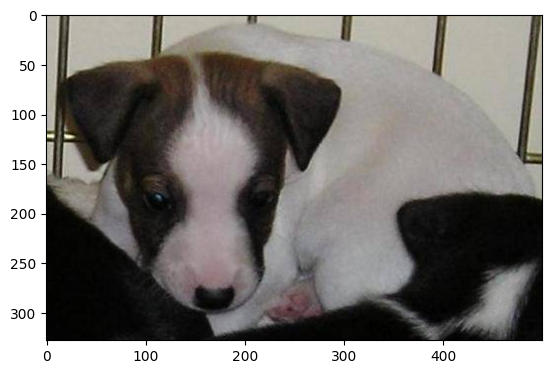

In [17]:
#display dog image
img =mpimg.imread("/content/train/dog.6081.jpg")
imgplt =plt.imshow(img)
plt.show()

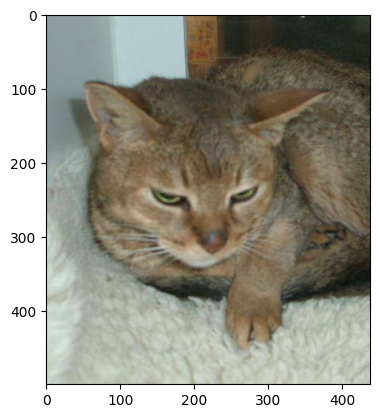

In [18]:
img =mpimg.imread("/content/train/cat.8025.jpg")
imgplt =plt.imshow(img)
plt.show()

In [19]:
file_names =os.listdir("/content/train")
for i in range(5):

  name =file_names[i]
  print(name[0:3])

cat
dog
cat
cat
dog


In [20]:
file_names =os.listdir("/content/train")
dog_count =0
cat_count =0
for img_file in file_names:
  name =img_file[0:3]

  if name=="dog":
    dog_count +=1
  else:
    cat_count +=1

print(f"Number of dog images : {dog_count}")
print(f"Number of cat images : {cat_count}")


Number of dog images : 12500
Number of cat images : 12500


In [21]:
#creating a directory for resized images
os.mkdir("/content/image resized")


In [22]:
original_folder = "/content/train/"
resized_folder = "/content/image resized/"

for i in range(2000):
  filename =os.listdir(original_folder)[i]
  img_path = original_folder+filename

  img =Image.open(img_path)
  img =img.resize((224,224))
  img=img.convert("RGB")
  newImgpath =resized_folder+filename
  img.save(newImgpath)



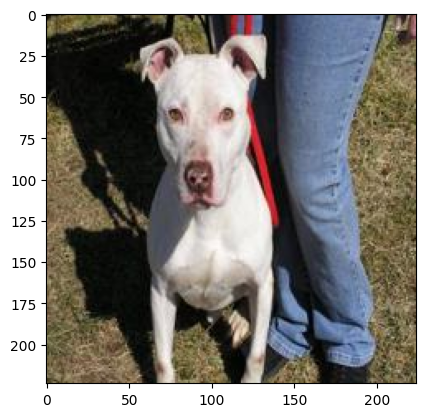

In [24]:
#display dog image
img =mpimg.imread("/content/image resized/dog.10036.jpg")
imgplt =plt.imshow(img)
plt.show()

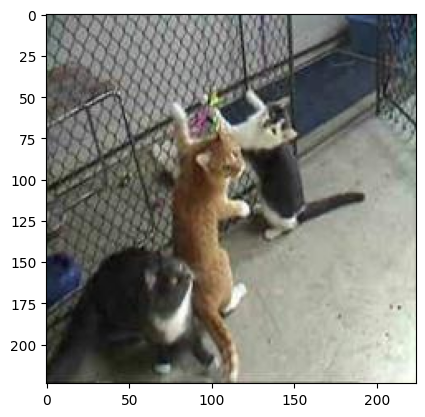

In [25]:
img =mpimg.imread("/content/image resized/cat.9960.jpg")
imgplt =plt.imshow(img)
plt.show()

Creating labels for resized images of dogs and cats

Cat --> 0

Dog --> 1

In [26]:
# creaing a for loop to assign labels
filenames =os.listdir("/content/image resized/")

labels =[]
for i in range (2000):
  file_name =filenames[i]
  label =file_name[0:3]

  if label=="dog":
    labels.append(1)
  else:
    labels.append(0)

In [27]:
print(filenames[0:5])
print(len(filenames))

['cat.7138.jpg', 'dog.6397.jpg', 'cat.5414.jpg', 'cat.12487.jpg', 'dog.9241.jpg']
2000


In [28]:
print(labels[0:5])
print(len(labels))

[0, 1, 0, 0, 1]
2000


In [29]:
#counting the image of dog and cat out if 2000 images
values ,counts =np.unique(labels,return_counts=True)
print(values)
print(counts)

[0 1]
[ 995 1005]


Converting all the resized images to numpy array

In [30]:
import cv2
import glob

In [31]:
image_directory = '/content/image resized/'
image_extension =["png","jpg"]
files =[]
[files.extend(glob.glob(image_directory +"*."+ e)) for e in image_extension]
dog_cat_images =np.asarray([cv2.imread(file) for file in files])

In [32]:
type(dog_cat_images)

numpy.ndarray

In [33]:
print(dog_cat_images)

[[[[132 148 155]
   [132 148 155]
   [132 148 155]
   ...
   [182 184 184]
   [182 184 184]
   [182 184 184]]

  [[132 148 155]
   [132 148 155]
   [132 148 155]
   ...
   [182 184 184]
   [182 184 184]
   [182 184 184]]

  [[132 148 155]
   [132 148 155]
   [132 148 155]
   ...
   [182 184 184]
   [182 184 184]
   [182 184 184]]

  ...

  [[146 146 146]
   [145 145 145]
   [144 144 144]
   ...
   [144 149 148]
   [143 147 148]
   [135 139 140]]

  [[150 150 150]
   [148 148 148]
   [146 146 146]
   ...
   [142 147 146]
   [143 147 148]
   [136 140 141]]

  [[153 153 153]
   [151 151 151]
   [148 148 148]
   ...
   [141 146 145]
   [143 147 148]
   [137 141 142]]]


 [[[ 43  45  23]
   [ 40  42  20]
   [ 38  39  19]
   ...
   [ 27  49  54]
   [ 19  44  48]
   [ 19  44  48]]

  [[ 43  45  23]
   [ 41  43  21]
   [ 40  41  21]
   ...
   [ 19  41  46]
   [ 13  38  42]
   [ 12  37  41]]

  [[ 44  46  24]
   [ 43  45  23]
   [ 42  43  23]
   ...
   [ 20  42  48]
   [ 17  39  45]
   [ 16  38

In [34]:
print(dog_cat_images.shape)

(2000, 224, 224, 3)


In [35]:
x = dog_cat_images
y =np.asarray(labels)

In [36]:
x

array([[[[132, 148, 155],
         [132, 148, 155],
         [132, 148, 155],
         ...,
         [182, 184, 184],
         [182, 184, 184],
         [182, 184, 184]],

        [[132, 148, 155],
         [132, 148, 155],
         [132, 148, 155],
         ...,
         [182, 184, 184],
         [182, 184, 184],
         [182, 184, 184]],

        [[132, 148, 155],
         [132, 148, 155],
         [132, 148, 155],
         ...,
         [182, 184, 184],
         [182, 184, 184],
         [182, 184, 184]],

        ...,

        [[146, 146, 146],
         [145, 145, 145],
         [144, 144, 144],
         ...,
         [144, 149, 148],
         [143, 147, 148],
         [135, 139, 140]],

        [[150, 150, 150],
         [148, 148, 148],
         [146, 146, 146],
         ...,
         [142, 147, 146],
         [143, 147, 148],
         [136, 140, 141]],

        [[153, 153, 153],
         [151, 151, 151],
         [148, 148, 148],
         ...,
         [141, 146, 145],
        

In [37]:
y

array([0, 1, 0, ..., 0, 0, 0])

In [38]:
x_train,x_test,y_train,y_test =train_test_split(x,y,random_state=2,test_size =0.2,stratify=y)

In [39]:
print(x.shape,x_train.shape,x_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


1600 --> training images

400 --> test images



In [40]:
# scaling the data
x_train_scaled =x_train/255
x_test_scaled =x_test/255

In [41]:
print(x_train_scaled)

[[[[0.81568627 0.78039216 0.76862745]
   [0.81568627 0.78039216 0.76862745]
   [0.81960784 0.78431373 0.77254902]
   ...
   [0.40392157 0.42745098 0.60392157]
   [0.46666667 0.49019608 0.66666667]
   [0.50980392 0.53333333 0.70980392]]

  [[0.81568627 0.78039216 0.76862745]
   [0.81960784 0.78431373 0.77254902]
   [0.81960784 0.78431373 0.77254902]
   ...
   [0.4        0.42352941 0.6       ]
   [0.46666667 0.49019608 0.66666667]
   [0.50980392 0.53333333 0.70980392]]

  [[0.81960784 0.78431373 0.77254902]
   [0.81960784 0.78431373 0.77254902]
   [0.82352941 0.78823529 0.77647059]
   ...
   [0.40784314 0.43137255 0.60784314]
   [0.48627451 0.50980392 0.68627451]
   [0.5372549  0.56078431 0.7372549 ]]

  ...

  [[0.54509804 0.5254902  0.52156863]
   [0.5372549  0.51764706 0.51372549]
   [0.5254902  0.50588235 0.50196078]
   ...
   [0.32941176 0.32941176 0.50980392]
   [0.43137255 0.43137255 0.61176471]
   [0.44313725 0.44313725 0.62352941]]

  [[0.53333333 0.51372549 0.50980392]
   [0.5

In [42]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

In [43]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNet
from tensorflow.keras import layers, models

# Load the MobileNet model without the top layers
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
base_model.trainable = False

# Create a new model on top
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  # This layer reduces the dimensions
    layers.Dense(2, activation='softmax')  # Output layer with 2 classes
])

# Display the model summary
model.build((None, 224, 224, 3))  # Set the input shape
model.summary()

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])



17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenet_1.00_224 (Functional)      │ (None, 7, 7, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 2)                   │           2,050 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,230,914 (12.32 MB)

 Trainable params: 2,050 (8.01 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [44]:
model.fit(x_train_scaled,y_train,epochs =5)

Epoch 1/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - accuracy: 0.8667 - loss: 0.3136
Epoch 2/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - accuracy: 0.9774 - loss: 0.0739
Epoch 3/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9845 - loss: 0.0554
Epoch 4/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.9805 - loss: 0.0550
Epoch 5/5
50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9930 - loss: 0.0346


In [45]:
score, acc =model.evaluate(x_test_scaled,y_test)
print("Test Loss = ",score)
print("Test accuracy = ",acc)

13/13 ━━━━━━━━━━━━━━━━━━━━ 6s 323ms/step - accuracy: 0.9783 - loss: 0.0639
Test Loss =  0.05728535354137421
Test accuracy =  0.9800000190734863


Predictive System

Path of the image to be predicted/content/cat.jpg


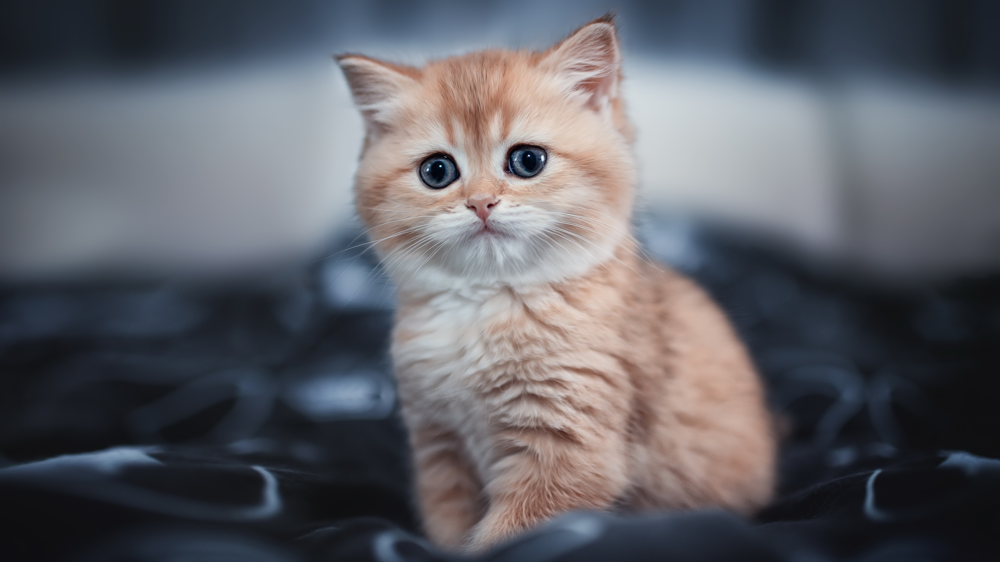

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
[[9.9999583e-01 4.1679405e-06]]
The image represent a Cat


In [46]:
input_image_path =input("Path of the image to be predicted")
input_image =cv2.imread(input_image_path)
cv2_imshow(input_image)
input_image_resize =cv2.resize(input_image,(224,224))
input_image_scaled =input_image_resize/255
image_reshaped =np.reshape(input_image_scaled,[1,224,224,3])
input_prediction =model.predict(image_reshaped)
print(input_prediction)
input_pred_label =np.argmax(input_prediction)
if (input_pred_label==1):
  print("The image represent a Dog ")
else:
  print("The image represent a Cat")





Path of the image to be predicted/content/dog.jpg


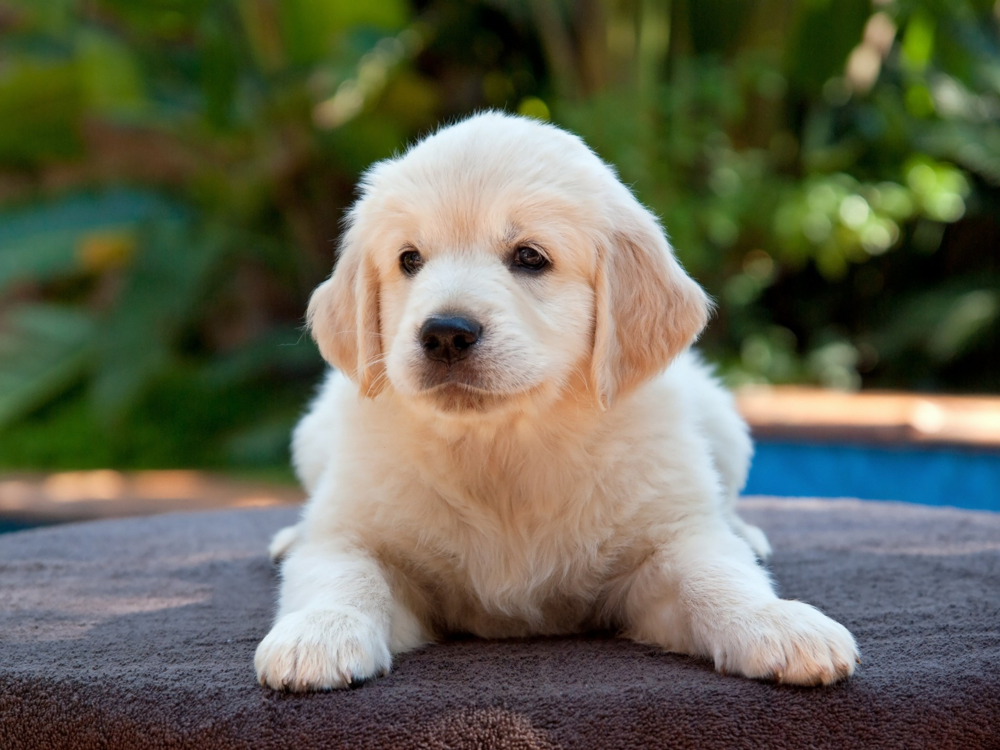

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
[[0.00327273 0.9967272 ]]
The image represent a Dog 


In [47]:
input_image_path =input("Path of the image to be predicted")
input_image =cv2.imread(input_image_path)
cv2_imshow(input_image)
input_image_resize =cv2.resize(input_image,(224,224))
input_image_scaled =input_image_resize/255
image_reshaped =np.reshape(input_image_scaled,[1,224,224,3])
input_prediction =model.predict(image_reshaped)
print(input_prediction)
input_pred_label =np.argmax(input_prediction)
if (input_pred_label==1):
  print("The image represent a Dog ")
else:
  print("The image represent a Cat")
